In [52]:
%load_ext autoreload
%autoreload 2
import sys
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler
sys.path.append('/Users/vishwajit/.pyenv/versions/3.7.3/lib/python3.7/site-packages/')
import umap
from tqdm import tqdm
sys.path.append('/Users/vishwajit/Desktop/SOMPY_robust_clustering-master/')
import sompy
from sompy.sompy import SOMFactory
from data_preprocessing import *
from Clustering_Attempts import *
from cat_wise_clustering import *
import importlib
import plotly.express as px

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [51]:
import Clustering_Attempts
import cat_wise_clustering
importlib.reload(Clustering_Attempts)
importlib.reload(cat_wise_clustering)

<module 'cat_wise_clustering' from '/Users/vishwajit/Desktop/Target Guests Demographic Analysis /cat_wise_clustering.py'>

## Data Preprocessing

In [3]:
# import data profiles csv
data = pd.read_csv('Data_Profiles.csv',index_col='zip code tabulation area')

### Get Percentage Data

In [4]:
df = get_attributes(data,'PE')

### Drop Puerto Rican Attributes

In [5]:
df = drop_PR_attributes(df)

In [6]:
df

,DP02_0001PE,DP02_0002PE,DP02_0003PE,DP02_0004PE,DP02_0005PE,DP02_0006PE,DP02_0007PE,DP02_0008PE,DP02_0009PE,DP02_0010PE,...,DP05_0022PE,DP05_0023PE,DP05_0024PE,DP05_0025PE,DP05_0026PE,DP05_0027PE,DP05_0028PE,DP05_0029PE,DP05_0030PE,DP05_0031PE
zip code tabulation area,,,,,,,,,,,,,,,,,,,,,
43964,3811.0,62.5,23.4,47.1,15.4,6.1,2.1,9.3,5.9,37.5,...,76.4,24.6,18.8,6822,48.4,51.6,-888888888,1626,44.5,55.5
28216,19911.0,60.3,29.1,33.9,13.8,5.6,3.1,20.8,12.1,39.7,...,71.0,12.0,9.9,38691,44.4,55.6,-888888888,5077,35.6,64.4
28277,26695.0,73.1,38.9,62.0,32.6,2.2,1.1,8.9,5.3,26.9,...,71.0,13.7,10.7,52429,46.2,53.8,-888888888,7632,42.2,57.8
28278,9176.0,76.1,37.8,60.4,30.0,5.3,3.1,10.4,4.6,23.9,...,70.0,11.2,8.4,19817,46.5,53.5,-888888888,2289,43.9,56.1
28303,13207.0,51.9,20.7,34.2,11.6,3.2,1.5,14.5,7.6,48.1,...,74.4,18.9,16.0,23116,47.4,52.6,-888888888,4704,38.1,61.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98279,340.0,55.9,11.8,51.2,8.2,4.1,3.5,0.6,0.0,44.1,...,90.0,46.5,38.1,572,53.8,46.2,-888888888,239,47.7,52.3
98280,238.0,52.1,8.8,52.1,8.8,0.0,0.0,0.0,0.0,47.9,...,90.4,59.7,56.4,386,44.3,55.7,-888888888,235,42.1,57.9
98311,10146.0,71.8,29.2,54.7,20.3,5.6,2.9,11.4,5.9,28.2,...,74.8,18.4,14.9,21799,51.3,48.7,-888888888,4141,44.8,55.2


### Drop zip codes with no population

In [7]:
df = drop_zero_pop_zipcodes(df)

### Fill the missing values

In [8]:
df = fill_missing_values(df,data)

In [9]:
df

,DP02_0001PE,DP02_0002PE,DP02_0003PE,DP02_0004PE,DP02_0005PE,DP02_0006PE,DP02_0007PE,DP02_0008PE,DP02_0009PE,DP02_0010PE,...,DP05_0022PE,DP05_0023PE,DP05_0024PE,DP05_0025PE,DP05_0026PE,DP05_0027PE,DP05_0028PE,DP05_0029PE,DP05_0030PE,DP05_0031PE
zip code tabulation area,,,,,,,,,,,,,,,,,,,,,
43964,3811.0,62.5,23.4,47.1,15.4,6.1,2.1,9.3,5.9,37.5,...,76.4,24.6,18.8,6822.0,48.4,51.6,NaN,1626.0,44.5,55.5
28216,19911.0,60.3,29.1,33.9,13.8,5.6,3.1,20.8,12.1,39.7,...,71.0,12.0,9.9,38691.0,44.4,55.6,NaN,5077.0,35.6,64.4
28277,26695.0,73.1,38.9,62.0,32.6,2.2,1.1,8.9,5.3,26.9,...,71.0,13.7,10.7,52429.0,46.2,53.8,NaN,7632.0,42.2,57.8
28278,9176.0,76.1,37.8,60.4,30.0,5.3,3.1,10.4,4.6,23.9,...,70.0,11.2,8.4,19817.0,46.5,53.5,NaN,2289.0,43.9,56.1
28303,13207.0,51.9,20.7,34.2,11.6,3.2,1.5,14.5,7.6,48.1,...,74.4,18.9,16.0,23116.0,47.4,52.6,NaN,4704.0,38.1,61.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98279,340.0,55.9,11.8,51.2,8.2,4.1,3.5,0.6,0.0,44.1,...,90.0,46.5,38.1,572.0,53.8,46.2,NaN,239.0,47.7,52.3
98280,238.0,52.1,8.8,52.1,8.8,0.0,0.0,0.0,0.0,47.9,...,90.4,59.7,56.4,386.0,44.3,55.7,NaN,235.0,42.1,57.9
98311,10146.0,71.8,29.2,54.7,20.3,5.6,2.9,11.4,5.9,28.2,...,74.8,18.4,14.9,21799.0,51.3,48.7,NaN,4141.0,44.8,55.2


### Manual Attribute Selection

In [10]:
df = manual_attr_selection(df).dropna(axis=1)

In [11]:
df

,DP02_0002PE,DP02_0003PE,DP02_0004PE,DP02_0006PE,DP02_0007PE,DP02_0008PE,DP02_0009PE,DP02_0012PE,DP02_0014PE,DP02_0018PE,...,DP05_0036PE,DP05_0037PE,DP05_0038PE,DP05_0039PE,DP05_0044PE,DP05_0057PE,DP05_0059PE,DP05_0060PE,DP05_0061PE,DP05_0071PE
zip code tabulation area,,,,,,,,,,,,,,,,,,,,,
43964,62.5,23.4,47.1,6.1,2.1,9.3,5.9,15.3,33.1,44.3,...,98.4,95.2,3.0,0.0,0.2,0.0,1.3,0.3,0.0,0.3
28216,60.3,29.1,33.9,5.6,3.1,20.8,12.1,8.2,19.0,39.6,...,97.6,26.6,64.4,0.0,2.1,4.4,1.0,0.3,0.1,8.0
28277,73.1,38.9,62.0,2.2,1.1,8.9,5.3,6.1,20.0,37.3,...,96.8,71.6,8.9,0.3,14.7,1.4,1.2,0.1,1.3,7.2
28278,76.1,37.8,60.4,5.3,3.1,10.4,4.6,3.5,16.0,33.6,...,93.6,53.2,31.8,0.0,6.3,2.2,4.2,0.2,0.5,10.5
28303,51.9,20.7,34.2,3.2,1.5,14.5,7.6,11.8,25.7,45.2,...,94.1,48.8,39.0,0.6,4.0,1.2,2.2,1.2,0.8,10.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98279,55.9,11.8,51.2,4.1,3.5,0.6,0.0,15.0,49.7,54.1,...,98.2,95.5,0.5,0.0,0.6,1.6,0.0,0.6,1.1,3.2
98280,52.1,8.8,52.1,0.0,0.0,0.0,0.0,33.2,74.4,57.1,...,99.3,94.5,0.0,0.0,4.8,0.0,0.0,0.0,0.7,2.9
98311,71.8,29.2,54.7,5.6,2.9,11.4,5.9,7.7,28.4,36.7,...,91.0,73.0,4.2,0.5,9.2,2.7,0.8,2.4,3.1,9.7


## Exploratory Data Analysis

### Comparing Attribute Mean Values

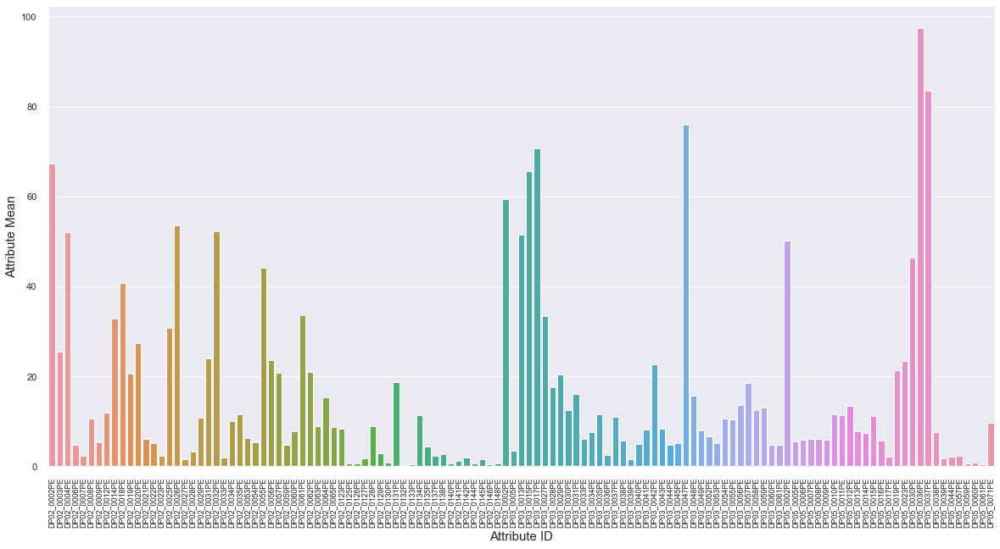

In [13]:
col_means = df.mean()
plt.figure(figsize=(20,10))
sns.set()
sns.barplot(x=col_means.index,y=col_means.values)
plt.xticks(rotation=90,fontsize=9)
plt.xlabel('Attribute ID',fontsize=15)
plt.ylabel('Attribute Mean',fontsize=15)
plt.savefig('Attribute_Means.jpg',dpi=200)

### Principal Component Analysis

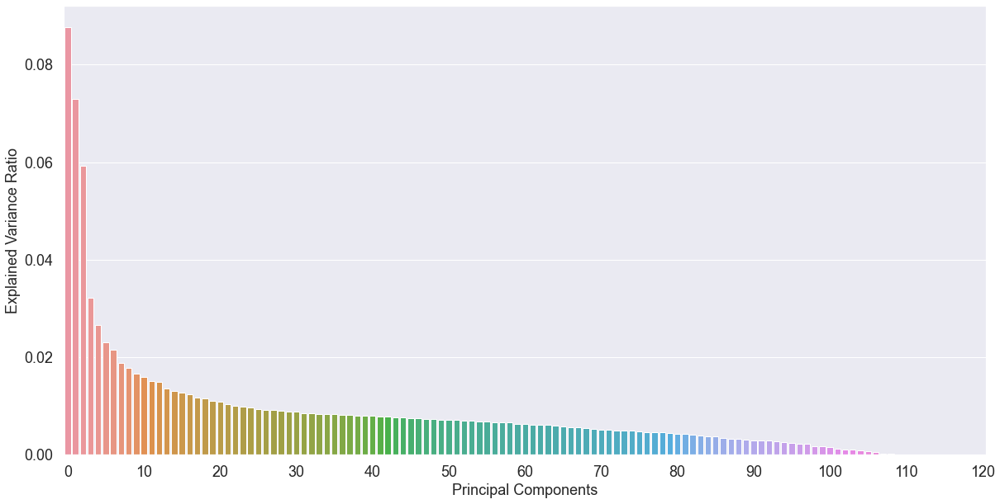

In [15]:
evr = PCA(121).fit(StandardScaler().fit_transform(df)).explained_variance_ratio_

plt.figure(figsize=(20,10))
sns.barplot(x=np.arange(1,122),y=evr)
plt.xlabel('Principal Components',fontsize=18)
plt.ylabel('Explained Variance Ratio',fontsize=18)
plt.yticks(fontsize=18)
plt.xticks(np.arange(0,125,10),labels=np.arange(0,125,10),fontsize=18)
plt.show()

## Clustering Attempts

### KMeans

100%|██████████| 10/10 [24:18<00:00, 145.84s/it]


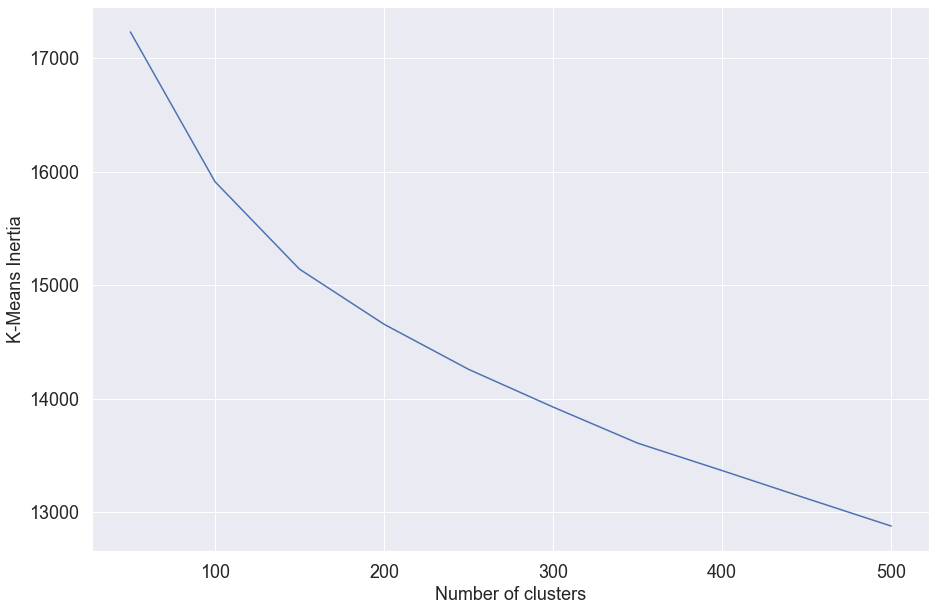

In [16]:
KMeans_clustering(df,50,550,50)

### DBSCAN

In [35]:
DBSCAN_clustering(df,[0.05,0.1,0.5,1],[3,5,8,10])

epsilon = 0.05
number of clusters = 0
number of noisy points = 32542
epsilon = 0.1
number of clusters = 0
number of noisy points = 32542
epsilon = 0.5
number of clusters = 6
number of noisy points = 11136
silhouette score = 0.11309407071255834
epsilon = 1
number of clusters = 1
number of noisy points = 2982
silhouette score = 0.4100111862201354
min samples = 3
number of clusters = 2
number of noisy points = 2978
silhouette score = 0.4093741808251686
min samples = 5
number of clusters = 1
number of noisy points = 2982
silhouette score = 0.4100111862201354
min samples = 8
number of clusters = 1
number of noisy points = 2986
silhouette score = 0.4099044839776164
min samples = 10
number of clusters = 1
number of noisy points = 2989
silhouette score = 0.4099160978145332
optimum number of clusters using dbscan = 1
optimum silhouette score using dbscan = 0.4100111862201354
the standard deviation in the number of clusters = 13289.0


### Self Organising Maps

grid size = (30, 30)
quantization error = 7.352253427940261
topographical error = 0.48491180628111363
grid size = (60, 60)
quantization error = 7.309951616126189
topographical error = 0.2842787781943335
grid size = (80, 80)
quantization error = 7.245561456350964
topographical error = 0.4449941613914326
number of clusters = 200
silhouette score = -0.05849926496427898


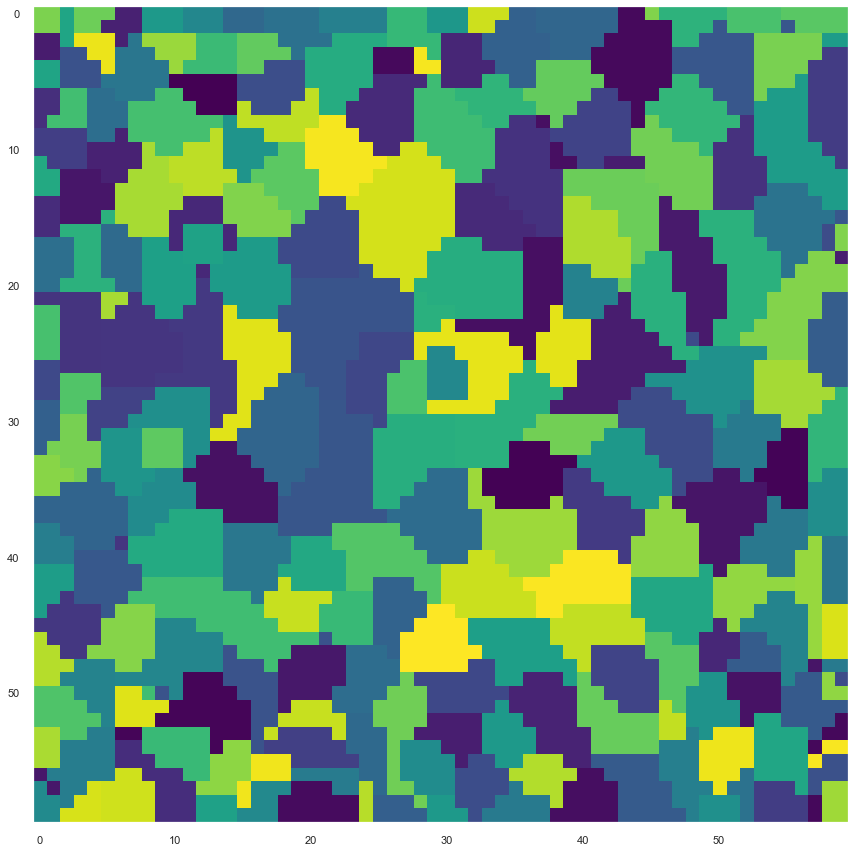

In [42]:
SOM_clustering(df,[(30,30),(60,60),(80,80)],n_clusters=200)

### t-SNE

In [50]:
tsne, opt_p = TSNE_dim_reduction(df,[10,50,100,500,1000])
px.scatter(x=tsne[opt_p].embedding_[:,0],y=tsne[opt_p].embedding_[:,1],height=600,width=800)

### UMAP

In [53]:
embedding = UMAP_dim_reduction(df)
px.scatter(x=embedding[:,0],y=embedding[:,1],height=600,width=800)

## Stage 1 Clustering

### Segregating features category-wise

In [91]:
attributes = pd.read_csv('Attribute Details2.csv',index_col='Name')
data = pd.read_csv('Cleaned_percent_data.csv',index_col='zcta')
data = drop_zero_pop_zipcodes(data)

In [92]:
categories = ['Households','Relationship','Marital Status','School Enrollment','Education Attainment','Language Spoken',
           'Ancestry','Employment Status','Occupation','Industry','Class of Worker','Income','Sex and Age','Race']
cat_df = pd.Series(index=data.columns)
col_list = list(data.columns)
for col in col_list:
    if(col[:4]=='DP02' and int(col[6:9])>0 and int(col[6:9])<=16):
        cat_df[col] = categories[0]
    elif(col[:4]=='DP02' and int(col[6:9])>16 and int(col[6:9])<=23):
        cat_df[col] = categories[1]
    elif(col[:4]=='DP02' and int(col[6:9])>23 and int(col[6:9])<=35):
        cat_df[col] = categories[2]
    elif(col[:4]=='DP02' and int(col[6:9])>51 and int(col[6:9])<=57):
        cat_df[col] = categories[3]
    elif(col[:4]=='DP02' and int(col[6:9])>57 and int(col[6:9])<=67):
        cat_df[col] = categories[4]
    elif(col[:4]=='DP02' and int(col[6:9])>109 and int(col[6:9])<=121):
        cat_df[col] = categories[5]
    elif(col[:4]=='DP02' and int(col[6:9])>122 and int(col[6:9])<=149):
        cat_df[col] = categories[6]
    elif(col[:4]=='DP03' and int(col[6:9])>0 and int(col[6:9])<=17):
        cat_df[col] = categories[7]
    elif(col[:4]=='DP03' and int(col[6:9])>25 and int(col[6:9])<=31):
        cat_df[col] = categories[8]
    elif(col[:4]=='DP03' and int(col[6:9])>31 and int(col[6:9])<=45):
        cat_df[col] = categories[9]
    elif(col[:4]=='DP03' and int(col[6:9])>45 and int(col[6:9])<=50):
        cat_df[col] = categories[10]
    elif(col[:4]=='DP03' and int(col[6:9])>51 and int(col[6:9])<=62):
        cat_df[col] = categories[11]
    elif(col[:4]=='DP05' and int(col[6:9])>0 and int(col[6:9])<=32):
        cat_df[col] = categories[12]
    elif(col[:4]=='DP05' and int(col[6:9])>36 and int(col[6:9])<=71):
        cat_df[col] = categories[13]

cat_df = cat_df.reset_index()
cat_df.rename({0:'class','index':'ID'},axis=1,inplace=True)
categories.remove('Language Spoken')

### Data preprocessing for stage 1 clustering

In [93]:
#Forming a separate dataframe for each category and processing them separately
data_dict = {} 
for cl in categories:
    data_dict[cl] = data[cat_df[cat_df['class']==cl]['ID'].values]
    data_dict[cl] = drop_zero_percent_attributes(data_dict[cl],pop_threshold=5)
    data_dict[cl] = data_dict[cl].drop(data_dict[cl].columns[data_dict[cl].mean()>100],axis=1)
    data_dict[cl] = drop_correlated_attributes(data_dict[cl],0.8)

### Correlation Heatmap for the category Education Attainment

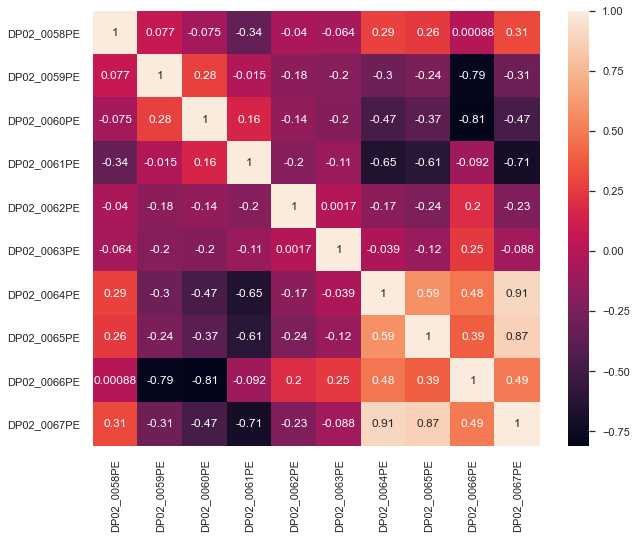

In [94]:
plt.figure(figsize=(10,8))
df_education = data[cat_df[cat_df['class']=='Education Attainment']['ID'].values]
sns.heatmap(df_education.corr(),annot=True)
plt.show()

### Density Plots for categories Occupation and Education Attainment

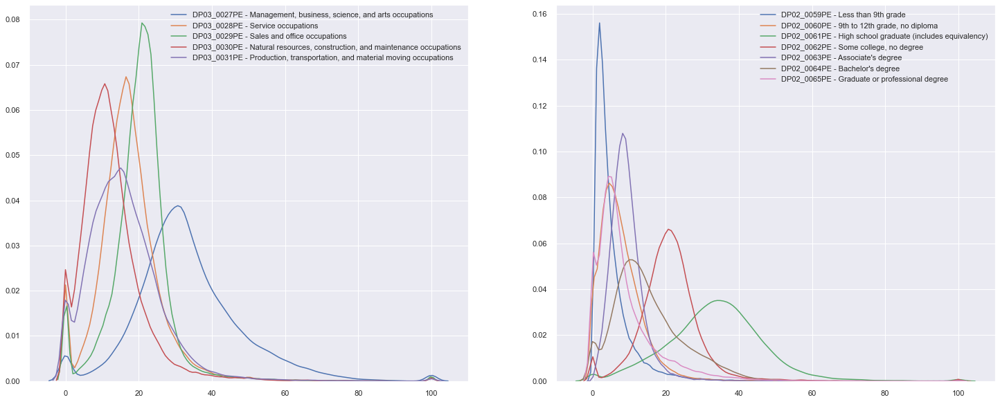

In [95]:
fig,ax = plt.subplots(1,2,figsize=(25,10))
i = 0
for cat in ['Occupation','Education Attainment']:
    cols = list(data_dict[cat].columns)
    for col in cols:
        name = attributes.loc[col,'Label_3']
        name = ' - '.join([col,name])
        sns.kdeplot(list(data[col]),ax=ax[i],label=name)
    i += 1

### Stage 1 clustering results

category = Households
number of features = 10
silhouette score = 0.17
Number of clusters =  8
category = Relationship
number of features = 6
silhouette score = 0.198
Number of clusters =  8
category = Marital Status
number of features = 10
silhouette score = 0.151
Number of clusters =  9
category = School Enrollment
number of features = 5
silhouette score = 0.224
Number of clusters =  7
category = Education Attainment
number of features = 7
silhouette score = 0.193
Number of clusters =  8
category = Ancestry
number of features = 21
silhouette score = 0.117
Number of clusters =  15
category = Employment Status
number of features = 5
silhouette score = 0.176
Number of clusters =  8
category = Occupation
number of features = 5
silhouette score = 0.204
Number of clusters =  8
category = Industry
number of features = 13
silhouette score = 0.111
Number of clusters =  12
category = Class of Worker
number of features = 3
silhouette score = 0.347
Number of clusters =  7
category = Income
number

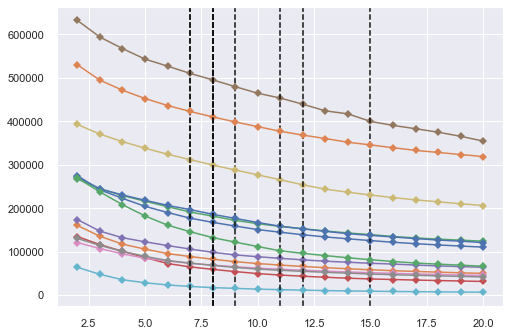

In [96]:
result_df = pd.DataFrame(index=data.index,columns=categories)
class_clust_dict = {}
for cl in categories:
    print(f'category = {cl}')
    df = data_dict[cl]
    opt_labels,elbow = cluster_category_data(df,scale_data='standard',dim_red_method=None,cluster_method='kmeans')
    print('Number of clusters = ',elbow)
    result_df[cl] = opt_labels
    class_clust_dict[cl] = elbow

### Cluster validation using XGBoost

In [97]:
for cl in categories:
    print('category = ',cl)
    df = pd.DataFrame(MinMaxScaler().fit_transform(data_dict[cl]),index=data_dict[cl].index,columns=data_dict[cl].columns)
    cluster_labels = result_df[cl]
    y = cluster_labels
    X_train,X_test,y_train,y_test = train_test_split(df,y,test_size=0.2,random_state=10)
    clf = XGBClassifier(n_estimators=1000,
                        max_depth=6,
                        learning_rate=0.01,
                        objective='binary:logistic',
                        eval_metric='auc')
    clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    print(f'accuracy score = {round(accuracy_score(y_test,y_pred),3)}')

category =  Households
accuracy score = 0.967
category =  Relationship
accuracy score = 0.973
category =  Marital Status
accuracy score = 0.975
category =  School Enrollment
accuracy score = 0.991
category =  Education Attainment
accuracy score = 0.976
category =  Ancestry
accuracy score = 0.95
category =  Employment Status
accuracy score = 0.963
category =  Occupation
accuracy score = 0.984
category =  Industry
accuracy score = 0.969
category =  Class of Worker
accuracy score = 0.994
category =  Income
accuracy score = 0.966
category =  Sex and Age
accuracy score = 0.964
category =  Race
accuracy score = 0.982


### Feature Importance using XGBoost

In [98]:
feature_importance_df = pd.DataFrame(index=data.columns)
for cl in categories:
    print('category = ',cl)
    df = pd.DataFrame(MinMaxScaler().fit_transform(data_dict[cl]),index=data_dict[cl].index,columns=data_dict[cl].columns)
    cluster_labels = result_df[cl]
    for c in range(class_clust_dict[cl]):
        print(f'cluster id = {c}')
        y = [1 if x==c else 0 for x in cluster_labels] #binary classification
        X_train,X_test,y_train,y_test = train_test_split(df,y,test_size=0.2,random_state=10)
        clf = XGBClassifier(n_estimators=1000,
                            max_depth=6,
                            learning_rate=0.01,
                            objective='binary:logistic',
                            eval_metric='auc')
        clf.fit(X_train,y_train)
        y_pred = clf.predict(X_test)
        imp_dict = clf.get_booster().get_score(importance_type='gain')
        feature_importance_df[cl+'_'+str(c)] = feature_importance_df.index.map(imp_dict)
        print(feature_importance_df[cl+'_'+str(c)].dropna().sort_values(ascending=False))
        print(f'accuracy score = {round(accuracy_score(y_test,y_pred),3)}')

category =  Households
cluster id = 0
DP02_0002PE    55.707214
DP02_0003PE    52.632954
DP02_0008PE    46.873801
DP02_0004PE    38.996666
DP02_0014PE    28.114817
DP02_0009PE    27.287206
DP02_0015PE    24.565693
DP02_0012PE    17.988440
DP02_0007PE    17.814511
DP02_0006PE    16.034165
Name: Households_0, dtype: float64
accuracy score = 0.959
cluster id = 1
DP02_0014PE    53.357513
DP02_0003PE    23.936746
DP02_0004PE    19.902311
DP02_0008PE    14.140515
DP02_0009PE    11.919951
DP02_0007PE    11.746517
DP02_0006PE    11.533393
DP02_0015PE     9.974597
DP02_0012PE     9.772311
DP02_0002PE     7.425828
Name: Households_1, dtype: float64
accuracy score = 0.988
cluster id = 2
DP02_0012PE    21.573473
DP02_0002PE     2.977219
DP02_0014PE     2.196182
DP02_0015PE     1.842824
DP02_0003PE     1.729384
DP02_0009PE     1.509065
DP02_0008PE     1.137493
DP02_0004PE     0.755266
DP02_0006PE     0.414337
DP02_0007PE     0.298236
Name: Households_2, dtype: float64
accuracy score = 0.999
cluster 

DP02_0057PE    108.635813
DP02_0055PE     54.470217
DP02_0056PE     27.462728
DP02_0054PE     18.039039
DP02_0053PE     17.140079
Name: School Enrollment_5, dtype: float64
accuracy score = 0.993
cluster id = 6
DP02_0053PE    25.837102
DP02_0054PE     2.962826
DP02_0057PE     1.266836
DP02_0055PE     0.958742
DP02_0056PE     0.886519
Name: School Enrollment_6, dtype: float64
accuracy score = 1.0
category =  Education Attainment
cluster id = 0
DP02_0064PE    71.716178
DP02_0065PE    44.673090
DP02_0063PE     7.371764
DP02_0062PE     7.042540
DP02_0061PE     6.219084
DP02_0060PE     3.683333
DP02_0059PE     3.103793
Name: Education Attainment_0, dtype: float64
accuracy score = 0.992
cluster id = 1
DP02_0061PE    42.434530
DP02_0062PE    41.446028
DP02_0064PE    39.643368
DP02_0063PE    35.578307
DP02_0060PE    33.657713
DP02_0065PE    28.814084
DP02_0059PE    20.666864
Name: Education Attainment_1, dtype: float64
accuracy score = 0.981
cluster id = 2
DP02_0061PE    89.441479
DP02_0060PE  

DP02_0125PE    22.070563
DP02_0137PE     1.899413
DP02_0129PE     1.822423
DP02_0126PE     1.057386
DP02_0141PE     0.990556
DP02_0142PE     0.872764
DP02_0128PE     0.675407
DP02_0127PE     0.659298
DP02_0145PE     0.626895
DP02_0140PE     0.550470
DP02_0135PE     0.538826
DP02_0123PE     0.482969
DP02_0131PE     0.473435
DP02_0134PE     0.275534
DP02_0144PE     0.191802
DP02_0138PE     0.092060
DP02_0132PE     0.035211
Name: Ancestry_10, dtype: float64
accuracy score = 1.0
cluster id = 11
DP02_0128PE    38.032403
DP02_0142PE    18.756052
DP02_0130PE    17.161758
DP02_0148PE     8.591510
DP02_0126PE     8.527992
DP02_0129PE     5.232455
DP02_0135PE     4.706950
DP02_0144PE     4.454592
DP02_0138PE     4.402315
DP02_0141PE     4.018776
DP02_0132PE     3.815307
DP02_0140PE     3.767727
DP02_0131PE     3.569278
DP02_0127PE     3.543923
DP02_0123PE     3.208623
DP02_0137PE     3.001183
DP02_0145PE     2.350932
DP02_0125PE     2.256191
DP02_0134PE     2.082076
DP02_0133PE     1.650323
DP02

DP03_0042PE    61.741845
DP03_0033PE     8.925896
DP03_0045PE     7.225849
DP03_0038PE     6.468806
DP03_0041PE     6.036473
DP03_0035PE     5.715760
DP03_0037PE     5.584172
DP03_0040PE     5.371854
DP03_0043PE     5.120258
DP03_0036PE     4.657412
DP03_0034PE     3.791025
DP03_0044PE     2.694579
DP03_0039PE     1.454464
Name: Industry_8, dtype: float64
accuracy score = 0.994
cluster id = 9
DP03_0035PE    142.504873
DP03_0033PE     17.529916
DP03_0037PE     16.521408
DP03_0045PE      8.801518
DP03_0043PE      8.643399
DP03_0044PE      8.221944
DP03_0042PE      7.264223
DP03_0036PE      7.212644
DP03_0034PE      7.131465
DP03_0041PE      7.076984
DP03_0038PE      6.944711
DP03_0039PE      5.620050
DP03_0040PE      4.900864
Name: Industry_9, dtype: float64
accuracy score = 0.99
cluster id = 10
DP03_0045PE    43.198437
DP03_0038PE     3.119197
DP03_0034PE     2.741038
DP03_0033PE     2.732378
DP03_0042PE     2.646608
DP03_0044PE     2.577033
DP03_0043PE     2.522465
DP03_0041PE     2.50

DP05_0032PE    43.662806
DP05_0018PE     3.315249
DP05_0030PE     3.154140
DP05_0019PE     2.129334
DP05_0023PE     2.027380
DP05_0002PE     1.265119
DP05_0014PE     1.154274
DP05_0007PE     1.144087
DP05_0017PE     1.111683
DP05_0006PE     0.985619
DP05_0013PE     0.841966
DP05_0011PE     0.761914
DP05_0009PE     0.758342
DP05_0012PE     0.641628
DP05_0010PE     0.496457
DP05_0016PE     0.432887
DP05_0008PE     0.375562
DP05_0015PE     0.372376
DP05_0005PE     0.307985
Name: Sex and Age_5, dtype: float64
accuracy score = 0.998
cluster id = 6
DP05_0009PE    18.442587
DP05_0008PE     6.400220
DP05_0030PE     1.864886
DP05_0017PE     1.778995
DP05_0018PE     1.718075
DP05_0005PE     1.300892
DP05_0013PE     1.130933
DP05_0023PE     1.018303
DP05_0019PE     1.000598
DP05_0014PE     0.956183
DP05_0032PE     0.933523
DP05_0010PE     0.876105
DP05_0016PE     0.849485
DP05_0015PE     0.734385
DP05_0006PE     0.659523
DP05_0012PE     0.641489
DP05_0002PE     0.549695
DP05_0011PE     0.429275
D

### XGBoost feature importance for 4 clusters in the category Race

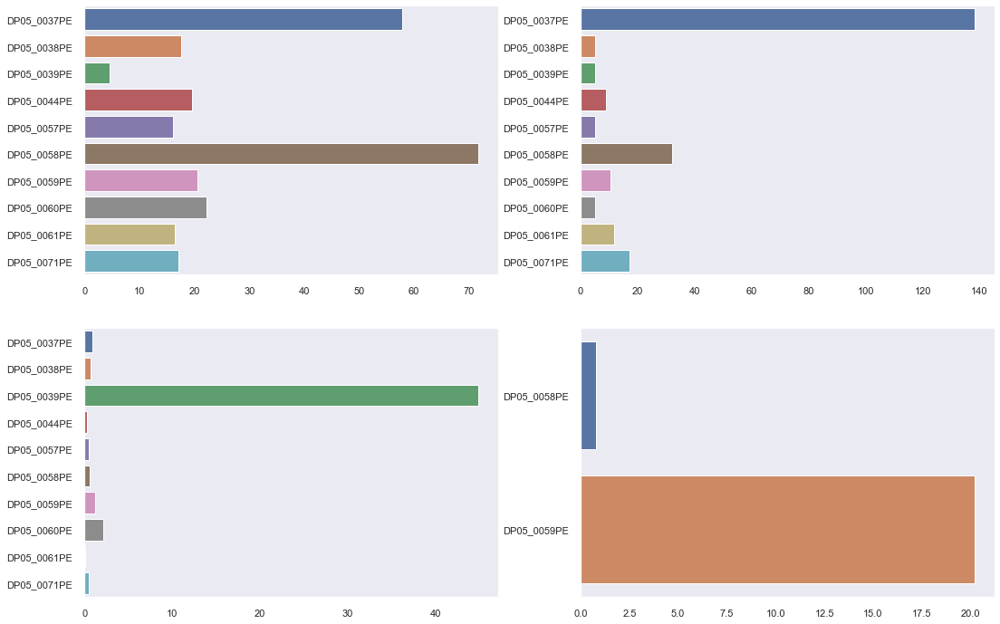

In [99]:
fig,ax = plt.subplots(2,2,figsize=(18,12))
for i in range(4):
    if i==0:
        j,k = 0,0
    if i==1:
        j,k = 0,1
    if i==2:
        j,k = 1,1
    if i==3:
        j,k = 1,0
    f_scores = feature_importance_df['Race_'+str(i)].dropna().values
    features = feature_importance_df['Race_'+str(i)].dropna().index
    sns.barplot(x=f_scores,y=features,ax=ax[j][k])
    ax[j][k].grid(False)

## Stage 2 Clustering

In [100]:
result_df

,Households,Relationship,Marital Status,School Enrollment,Education Attainment,Ancestry,Employment Status,Occupation,Industry,Class of Worker,Income,Sex and Age,Race
zcta,,,,,,,,,,,,,
43964,0,4,4,5,1,2,6,2,0,0,1,1,1
28216,4,1,1,2,0,4,0,1,2,0,2,0,4
28277,6,0,4,5,7,2,0,4,2,0,3,0,0
28278,6,1,4,2,0,5,5,1,2,0,0,0,0
28303,5,4,0,2,0,4,6,1,0,5,1,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
98279,1,2,4,2,0,11,1,0,3,1,2,3,1
98280,1,2,4,3,7,11,7,4,0,1,2,2,1
98311,0,4,0,2,1,2,0,1,0,5,0,1,0


### Dimensionality reduction using UMAP

In [101]:
embedding = umap.UMAP(n_components=2,
                      n_neighbors=5,
                      min_dist=0.001,
                      metric='hamming',
                      random_state=1,
                      spread=0.5,
                      n_epochs=2000).fit_transform(result_df)
px.scatter(x=embedding[:,0],y=embedding[:,1],height=600,width=800)

### Clustering using KMeans

In [102]:
km = KMeans(n_clusters=300).fit(embedding)
cluster_labels = km.labels_
print(f'silhouette score = {round(silhouette_score(embedding,cluster_labels),3)}')

silhouette score = 0.5019999742507935


### Category importance

In [103]:
result_df_encoded

,Households_0,Households_1,Households_2,Households_3,Households_4,Households_5,Households_6,Households_7,Relationship_0,Relationship_1,...,Sex and Age_5,Race_0,Race_1,Race_2,Race_3,Race_4,Race_5,Race_6,Race_7,cluster_labels
zcta,,,,,,,,,,,,,,,,,,,,,
43964,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,29
28216,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,26
28277,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,111
28278,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,99
28303,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98279,0,0,0,0,0,0,1,0,0,0,...,1,0,1,0,0,0,0,0,0,124
98280,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,41
98311,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,153


In [104]:
for col in result_df.columns:
    result_df[col] = result_df[col].astype(object)
result_df_encoded = pd.get_dummies(result_df)
feature_imp_df2 = pd.DataFrame(index=result_df_encoded.columns,columns=list(range(300)))
result_df_encoded['cluster_labels'] = cluster_labels
cluster_df = result_df_encoded.groupby('cluster_labels').sum()
for clust in range(300):
    print(f'cluster id = {clust}')
    feature_importance = cluster_df.iloc[clust,:]/len(result_df_encoded[result_df_encoded['cluster_labels']==clust])
    feature_imp_df2[clust] = feature_importance
    print(feature_importance.sort_values(ascending=False)[:10])

cluster id = 0
Marital Status_0          0.978261
Households_0              0.923913
Class of Worker_0         0.891304
Employment Status_0       0.891304
Sex and Age_1             0.836957
Industry_0                0.804348
Ancestry_7                0.717391
Education Attainment_1    0.663043
Occupation_1              0.608696
Income_2                  0.597826
Name: 0, dtype: float64
cluster id = 1
Marital Status_4       0.933962
Sex and Age_1          0.801887
Employment Status_6    0.792453
Households_0           0.764151
Relationship_4         0.764151
School Enrollment_5    0.716981
Race_1                 0.707547
Ancestry_4             0.566038
Industry_9             0.518868
Class of Worker_5      0.500000
Name: 1, dtype: float64
cluster id = 2
Race_1                    0.896552
Households_6              0.862069
Employment Status_5       0.834483
Marital Status_2          0.813793
Relationship_0            0.800000
Ancestry_6                0.717241
School Enrollment_5       0

Race_1                 0.820513
Industry_0             0.705128
Households_1           0.660256
Marital Status_2       0.576923
School Enrollment_5    0.570513
Class of Worker_3      0.570513
Relationship_2         0.519231
Employment Status_3    0.500000
Occupation_1           0.467949
Sex and Age_2          0.435897
Name: 55, dtype: float64
cluster id = 56
Race_1                 0.940299
Households_1           0.835821
Sex and Age_3          0.828358
Marital Status_4       0.746269
Ancestry_2             0.574627
Industry_9             0.567164
Relationship_2         0.552239
Income_1               0.500000
Employment Status_2    0.500000
Occupation_2           0.432836
Name: 56, dtype: float64
cluster id = 57
Industry_9                0.911765
School Enrollment_5       0.875000
Marital Status_0          0.860294
Relationship_1            0.845588
Sex and Age_0             0.801471
Households_4              0.779412
Occupation_2              0.742647
Class of Worker_0         0.72058

Households_4              0.925532
Relationship_1            0.914894
Industry_0                0.765957
Race_4                    0.744681
School Enrollment_2       0.734043
Ancestry_4                0.734043
Education Attainment_1    0.680851
Sex and Age_0             0.680851
Employment Status_5       0.606383
Class of Worker_3         0.574468
Name: 109, dtype: float64
cluster id = 110
Ancestry_4                0.956522
Relationship_1            0.930435
Income_9                  0.913043
Sex and Age_1             0.843478
School Enrollment_2       0.817391
Race_5                    0.808696
Industry_0                0.765217
Households_4              0.747826
Education Attainment_6    0.608696
Marital Status_0          0.591304
Name: 110, dtype: float64
cluster id = 111
Ancestry_4             0.96
Relationship_1         0.95
Race_3                 0.90
Sex and Age_0          0.85
Class of Worker_4      0.83
School Enrollment_5    0.82
Households_4           0.75
Industry_10       

Ancestry_4             0.972973
Industry_0             0.878378
Race_5                 0.763514
School Enrollment_2    0.736486
Marital Status_0       0.729730
Households_4           0.716216
Sex and Age_0          0.648649
Employment Status_6    0.621622
Relationship_1         0.587838
Income_1               0.540541
Name: 161, dtype: float64
cluster id = 162
Industry_0             0.98
Households_0           0.95
Marital Status_4       0.94
Sex and Age_1          0.92
Relationship_4         0.86
Race_1                 0.85
School Enrollment_2    0.70
Ancestry_7             0.67
Employment Status_0    0.67
Class of Worker_3      0.64
Name: 162, dtype: float64
cluster id = 163
Households_6              0.994048
Income_0                  0.934524
Occupation_1              0.904762
Relationship_0            0.875000
Employment Status_5       0.797619
Education Attainment_0    0.779762
Industry_0                0.773810
Ancestry_2                0.738095
Marital Status_4          0.714286

Marital Status_4       0.914286
Relationship_4         0.914286
Employment Status_2    0.876190
Race_1                 0.857143
Households_0           0.838095
Class of Worker_3      0.828571
Sex and Age_1          0.809524
Occupation_2           0.723810
Industry_9             0.704762
School Enrollment_5    0.638095
Name: 219, dtype: float64
cluster id = 220
Marital Status_0       0.980392
Industry_0             0.862745
Income_1               0.679739
Relationship_4         0.673203
Employment Status_2    0.633987
Race_1                 0.627451
Households_0           0.620915
School Enrollment_5    0.614379
Sex and Age_1          0.601307
Ancestry_2             0.562092
Name: 220, dtype: float64
cluster id = 221
Households_1           0.842105
Sex and Age_3          0.710526
Race_1                 0.605263
Relationship_2         0.526316
Income_1               0.526316
Industry_9             0.473684
Occupation_5           0.473684
Ancestry_4             0.473684
Class of Worker_0 

Race_1                    0.909639
Households_1              0.837349
Relationship_2            0.813253
Sex and Age_3             0.807229
Marital Status_2          0.692771
Industry_9                0.686747
Ancestry_2                0.572289
Employment Status_2       0.548193
Education Attainment_2    0.415663
Income_2                  0.391566
Name: 278, dtype: float64
cluster id = 279
Households_4           0.960784
Relationship_1         0.941176
Occupation_0           0.921569
Class of Worker_0      0.823529
Ancestry_4             0.823529
School Enrollment_2    0.784314
Sex and Age_0          0.745098
Income_1               0.705882
Industry_0             0.686275
Employment Status_0    0.549020
Name: 279, dtype: float64
cluster id = 280
Sex and Age_3          0.925620
Employment Status_6    0.834711
Marital Status_4       0.826446
Relationship_4         0.801653
Race_1                 0.776860
Industry_0             0.776860
Income_1               0.768595
School Enrollment_5 

### Category importance for clusters 0, 1,  2 and 3

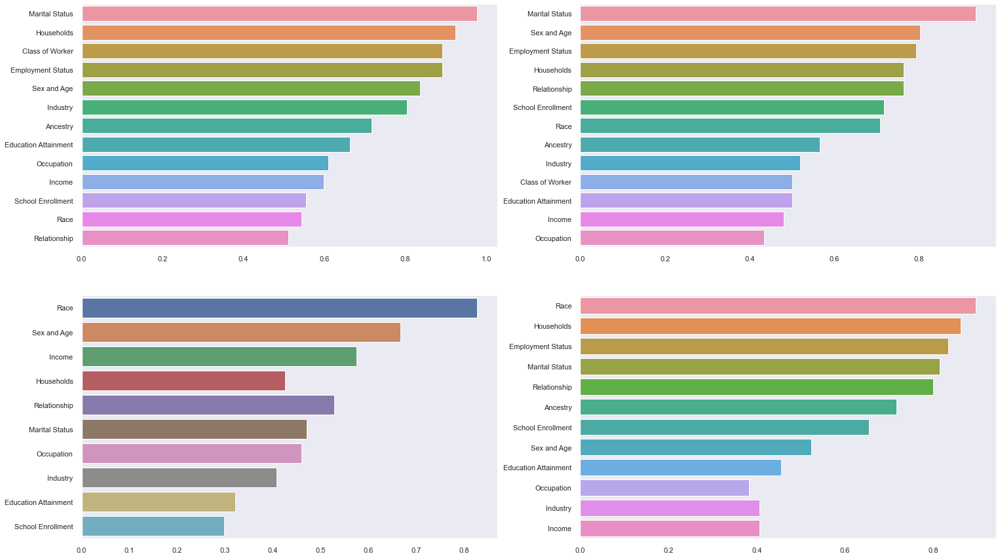

In [105]:
fig,ax = plt.subplots(2,2,figsize=(25,15))
for i in range(4):
    if i==0:
        j,k = 0,0
    if i==1:
        j,k = 0,1
    if i==2:
        j,k = 1,1
    if i==3:
        j,k = 1,0
    c_scores = feature_imp_df2[i].sort_values(ascending=False)[:13].values
    c_scores = np.round(c_scores,3)
    categories = np.array([x.split('_')[0] for x in feature_imp_df2[i].sort_values(ascending=False)[:13].index])
    sns.barplot(y=categories,x=c_scores,ax=ax[j][k],ci=None)
    ax[j][k].grid(False)

In [107]:
data['cluster_labels'] = cluster_labels

## Results

In [134]:
np.random.seed(11)
zipcode = np.random.choice(data.index,1,replace=False)[0]
print(f'zip code is',zipcode)
cluster = data.loc[zipcode,'cluster_labels']
print(f'{zipcode} belongs to the cluster {cluster}')
imp_cat_series = feature_imp_df2[cluster].sort_values(ascending=False)[:13]
imp_categories = [x.split('_')[0] for x in imp_cat_series[imp_cat_series>0.8].index]
non_imp_categories = []
for cat in imp_categories:
    c_label = result_df.loc[zipcode,cat]
    temp_df = pd.DataFrame(result_df[cat])
    temp_df['cluster_labels'] = cluster_labels
    max_c_label = temp_df[temp_df['cluster_labels']==cluster][cat].value_counts().index[0]
    if(c_label!=max_c_label):
        non_imp_categories.append(cat)
for i in range(len(non_imp_categories)):
    imp_categories.remove(non_imp_categories[i])
if len(imp_categories)>3:
    imp_categories = imp_categories[:3]
print(f'The important Categories are {imp_categories}')
zipcode_features = {}
for cat in imp_categories:
    c_label = result_df.loc[zipcode,cat]
    print(f'zip code {zipcode} belongs to cluster {c_label} in the category {cat}')
    imp_features = feature_importance_df[cat+'_'+str(c_label)].dropna().sort_values(ascending=False).index
    zipcode_features[cat] = []
    for feature in imp_features:
        data_dict[cat]['cluster_labels'] = result_df[cat]
        cl_mean = data_dict[cat][data_dict[cat]['cluster_labels']==c_label][feature].mean()
        cl_std = data_dict[cat][data_dict[cat]['cluster_labels']==c_label][feature].std()
        zip_percent = data.loc[zipcode,feature]
        if zip_percent>cl_mean+2*cl_std or zip_percent<cl_mean-2*cl_std:
            continue
        else:
            zipcode_features[cat].append(feature)
        if len(zipcode_features[cat])==2:
            break
    print(f'important attributes in the category {cat} are {zipcode_features[cat]}')

zip code is 10128
10128 belongs to the cluster 119
The important Categories are ['Education Attainment', 'Households', 'Industry']
zip code 10128 belongs to cluster 7 in the category Education Attainment
important attributes in the category Education Attainment are ['DP02_0065PE', 'DP02_0064PE']
zip code 10128 belongs to cluster 5 in the category Households
important attributes in the category Households are ['DP02_0002PE', 'DP02_0014PE']
zip code 10128 belongs to cluster 2 in the category Industry
important attributes in the category Industry are ['DP03_0041PE', 'DP03_0040PE']


### Category Importance for zip code's cluster (119)

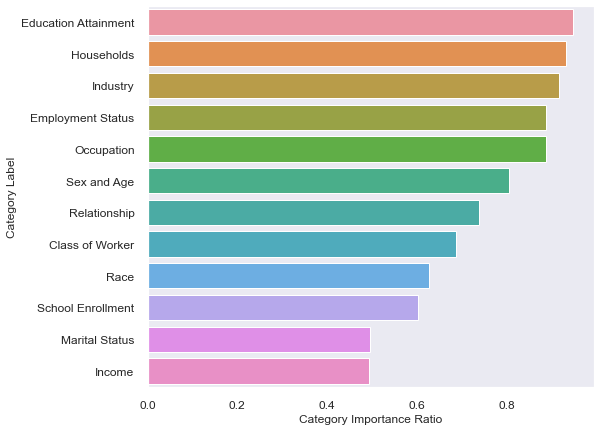

In [135]:
plt.figure(figsize=(8,7))
c_scores = feature_imp_df2[cluster].sort_values(ascending=False)[:13].values
c_scores = np.round(c_scores,3)
categories = np.array([x.split('_')[0] for x in feature_imp_df2[119].sort_values(ascending=False)[:13].index])
sns.barplot(y=categories,x=c_scores,ci=None)
plt.grid(False)
plt.xlabel('Category Importance Ratio',fontsize=12)
plt.ylabel('Category Label',fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('Category Importance 119.png',dpi=200)

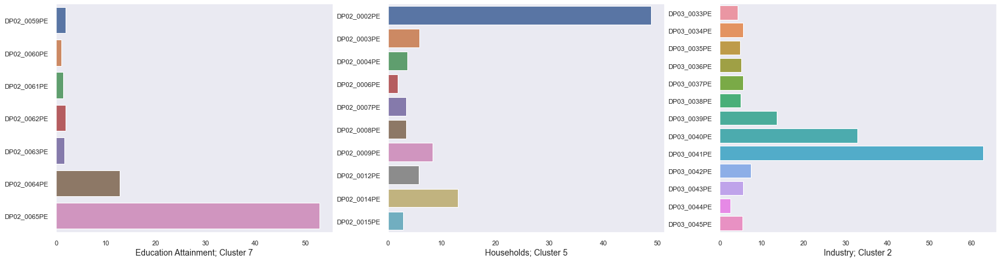

In [137]:
fig,ax = plt.subplots(1,3,figsize=(28,7))
f_scores = feature_importance_df['Education Attainment_7'].dropna().values
features = feature_importance_df['Education Attainment_7'].dropna().index
sns.barplot(x=f_scores,y=features,ax=ax[0])
ax[0].set_xlabel('Education Attainment; Cluster 7',fontsize=14)
ax[0].grid(False)
f_scores = feature_importance_df['Households_5'].dropna().values
features = feature_importance_df['Households_5'].dropna().index
sns.barplot(x=f_scores,y=features,ax=ax[1])
ax[1].set_xlabel('Households; Cluster 5',fontsize=14)
ax[1].grid(False)
f_scores = feature_importance_df['Industry_2'].dropna().values
features = feature_importance_df['Industry_2'].dropna().index
sns.barplot(x=f_scores,y=features,ax=ax[2])
ax[2].set_xlabel('Industry; Cluster 2',fontsize=14)
ax[2].grid(False)
#plt.savefig('Feature Importance 67001.png',dpi=200)